In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_excel('INX_Future_Inc_Employee_Performance_CDS_Project2_Data_V1.8.xlsx')
data

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,...,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,...,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,...,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,...,2,9,3,4,8,7,7,7,No,3


### basic checks

In [3]:
data.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3


In [4]:
data.tail()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,...,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,...,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,...,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,...,2,9,3,4,8,7,7,7,No,3
1199,E100998,24,Female,Life Sciences,Single,Sales,Sales Executive,Travel_Rarely,3,2,...,1,4,3,3,2,2,2,0,Yes,2


In [5]:
data.shape

(1200, 28)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   EmpNumber                     1200 non-null   object
 1   Age                           1200 non-null   int64 
 2   Gender                        1200 non-null   object
 3   EducationBackground           1200 non-null   object
 4   MaritalStatus                 1200 non-null   object
 5   EmpDepartment                 1200 non-null   object
 6   EmpJobRole                    1200 non-null   object
 7   BusinessTravelFrequency       1200 non-null   object
 8   DistanceFromHome              1200 non-null   int64 
 9   EmpEducationLevel             1200 non-null   int64 
 10  EmpEnvironmentSatisfaction    1200 non-null   int64 
 11  EmpHourlyRate                 1200 non-null   int64 
 12  EmpJobInvolvement             1200 non-null   int64 
 13  EmpJobLevel       

In [7]:
data.isnull().sum() 

EmpNumber                       0
Age                             0
Gender                          0
EducationBackground             0
MaritalStatus                   0
EmpDepartment                   0
EmpJobRole                      0
BusinessTravelFrequency         0
DistanceFromHome                0
EmpEducationLevel               0
EmpEnvironmentSatisfaction      0
EmpHourlyRate                   0
EmpJobInvolvement               0
EmpJobLevel                     0
EmpJobSatisfaction              0
NumCompaniesWorked              0
OverTime                        0
EmpLastSalaryHikePercent        0
EmpRelationshipSatisfaction     0
TotalWorkExperienceInYears      0
TrainingTimesLastYear           0
EmpWorkLifeBalance              0
ExperienceYearsAtThisCompany    0
ExperienceYearsInCurrentRole    0
YearsSinceLastPromotion         0
YearsWithCurrManager            0
Attrition                       0
PerformanceRating               0
dtype: int64

In [8]:
data.describe() 

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


In [9]:
data.describe(include = 'O') 

,EmpNumber,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,OverTime,Attrition
count,1200,1200,1200,1200,1200,1200,1200,1200,1200
unique,1200,2,6,3,6,19,3,2,2
top,E1001000,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Rarely,No,No
freq,1,725,492,548,373,270,846,847,1022


In [10]:
data.columns

Index(['EmpNumber', 'Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition', 'PerformanceRating'],
      dtype='object')

In [11]:
data.Gender.value_counts()

Gender
Male      725
Female    475
Name: count, dtype: int64

In [12]:
data.EducationBackground.value_counts() 

EducationBackground
Life Sciences       492
Medical             384
Marketing           137
Technical Degree    100
Other                66
Human Resources      21
Name: count, dtype: int64

In [13]:
data.MaritalStatus.value_counts()

MaritalStatus
Married     548
Single      384
Divorced    268
Name: count, dtype: int64

In [14]:
data.EmpDepartment.value_counts() 

EmpDepartment
Sales                     373
Development               361
Research & Development    343
Human Resources            54
Finance                    49
Data Science               20
Name: count, dtype: int64

In [15]:
data.EmpJobRole.value_counts()  

EmpJobRole
Sales Executive              270
Developer                    236
Manager R&D                   94
Research Scientist            77
Sales Representative          69
Laboratory Technician         64
Senior Developer              52
Manager                       51
Finance Manager               49
Human Resources               45
Technical Lead                38
Manufacturing Director        33
Healthcare Representative     33
Data Scientist                20
Research Director             19
Business Analyst              16
Senior Manager R&D            15
Delivery Manager              12
Technical Architect            7
Name: count, dtype: int64

In [16]:
data.BusinessTravelFrequency.value_counts()

BusinessTravelFrequency
Travel_Rarely        846
Travel_Frequently    222
Non-Travel           132
Name: count, dtype: int64

In [17]:
data.OverTime.value_counts() 

OverTime
No     847
Yes    353
Name: count, dtype: int64

In [18]:
data.Attrition.value_counts()

Attrition
No     1022
Yes     178
Name: count, dtype: int64

In [19]:
data[data.duplicated()]

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating


In [20]:
data = data.drop(['EmpNumber'],axis =1 ) 

### eda

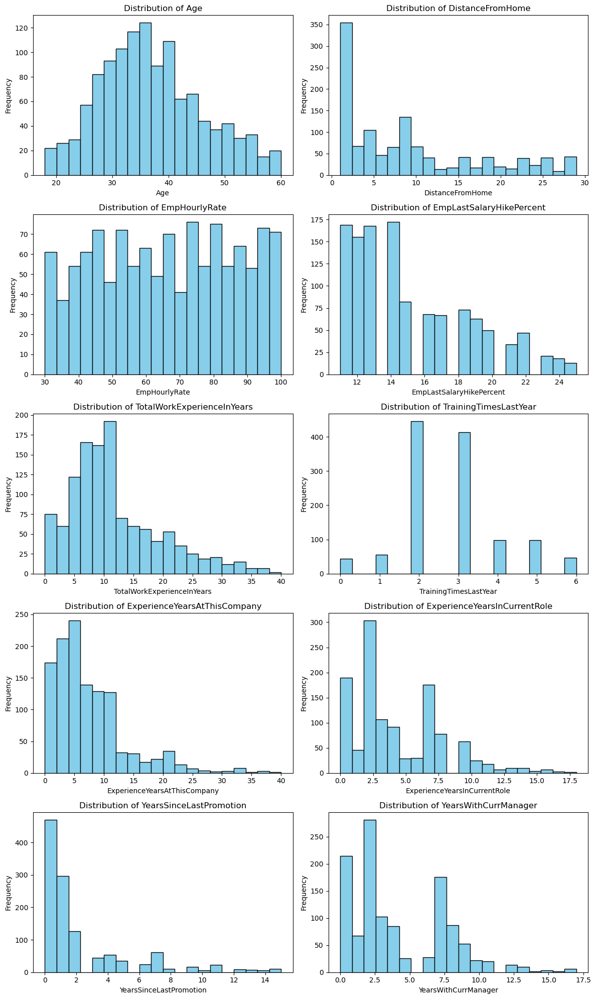

In [21]:
numerical_columns = [
    'Age', 'DistanceFromHome', 'EmpHourlyRate', 'EmpLastSalaryHikePercent',
    'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
    'ExperienceYearsAtThisCompany', 'ExperienceYearsInCurrentRole',
    'YearsSinceLastPromotion', 'YearsWithCurrManager'
]


fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(12, 20))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    axes[i].hist(data[col], bins=20, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

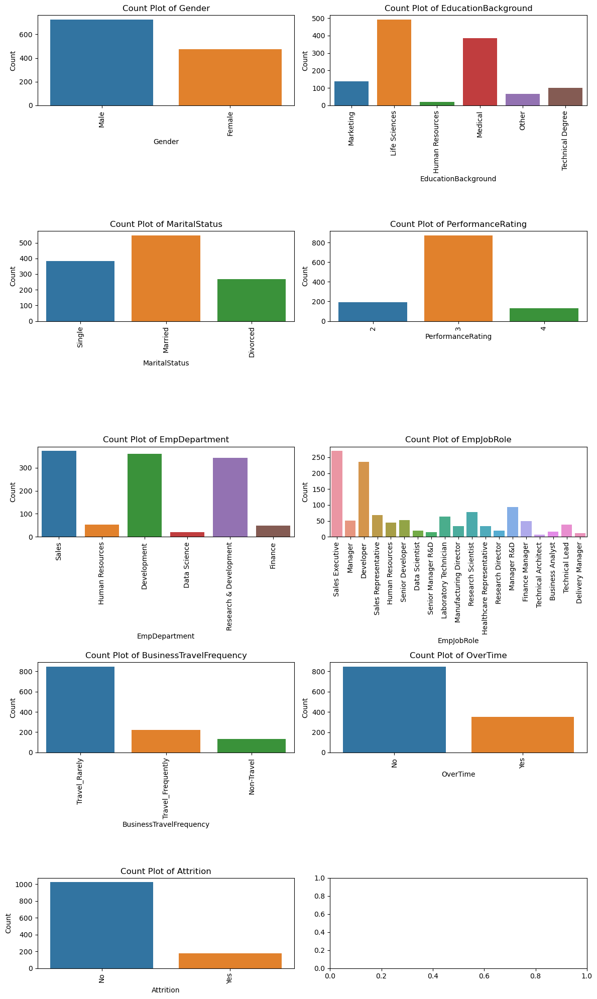

In [22]:
categorical_columns = [
   'Gender', 'EducationBackground', 'MaritalStatus', 'PerformanceRating',
    'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency', 'OverTime', 'Attrition'
]

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(12, 20))
axes = axes.flatten()

for i, col in enumerate(categorical_columns):
    sns.countplot(data=data, x=col, ax=axes[i])
    axes[i].set_title(f'Count Plot of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=90) 
plt.tight_layout()
plt.show()


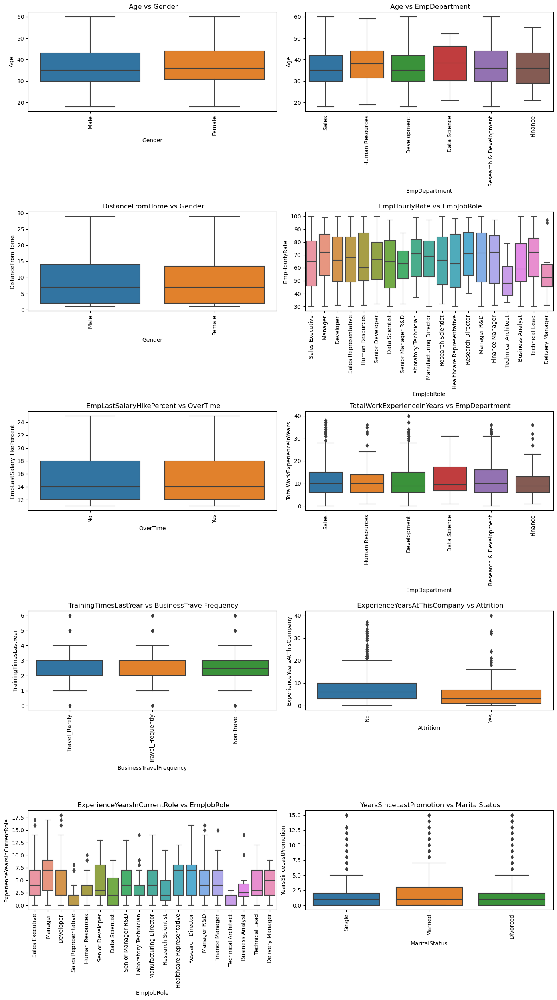

In [23]:
categorical_numerical_pairs = [
    ('Age', 'Gender'),
    ('Age', 'EmpDepartment'),
    ('DistanceFromHome', 'Gender'),
    ('EmpHourlyRate', 'EmpJobRole'),
    ('EmpLastSalaryHikePercent', 'OverTime'),
    ('TotalWorkExperienceInYears', 'EmpDepartment'),
    ('TrainingTimesLastYear', 'BusinessTravelFrequency'),
    ('ExperienceYearsAtThisCompany', 'Attrition'),
    ('ExperienceYearsInCurrentRole', 'EmpJobRole'),
    ('YearsSinceLastPromotion', 'MaritalStatus')
]

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 25))
axes = axes.flatten()

for i, (numerical_col, categorical_col) in enumerate(categorical_numerical_pairs):
    sns.boxplot(x=data[categorical_col], y=data[numerical_col], ax=axes[i])
    axes[i].set_title(f' {numerical_col} vs {categorical_col}')
    axes[i].set_xlabel(categorical_col)
    axes[i].set_ylabel(numerical_col)
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()


In [24]:
# Auto EDA
from ydata_profiling import ProfileReport
!pip install ydata-profiling
profile=ProfileReport(data,title="EDA",explorative=False)
profile

Defaulting to user installation because normal site-packages is not writeable


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### encoding

In [25]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

data['OverTime'] = label_encoder.fit_transform(data['OverTime'])
data['Attrition'] = label_encoder.fit_transform(data['Attrition'])

In [26]:
data = pd.get_dummies(data, columns = ['Gender', 'EducationBackground', 'MaritalStatus', 'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency'],dtype=int)


In [27]:
data

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,...,EmpJobRole_Research Scientist,EmpJobRole_Sales Executive,EmpJobRole_Sales Representative,EmpJobRole_Senior Developer,EmpJobRole_Senior Manager R&D,EmpJobRole_Technical Architect,EmpJobRole_Technical Lead,BusinessTravelFrequency_Non-Travel,BusinessTravelFrequency_Travel_Frequently,BusinessTravelFrequency_Travel_Rarely
0,32,10,3,4,55,3,2,4,1,0,...,0,1,0,0,0,0,0,0,0,1
1,47,14,4,4,42,3,2,1,2,0,...,0,1,0,0,0,0,0,0,0,1
2,40,5,4,4,48,2,3,1,5,1,...,0,1,0,0,0,0,0,0,1,0
3,41,10,4,2,73,2,5,4,3,0,...,0,0,0,0,0,0,0,0,0,1
4,60,16,4,1,84,3,2,1,8,0,...,0,1,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,27,3,1,4,71,4,2,4,1,1,...,0,1,0,0,0,0,0,0,1,0
1196,37,10,2,4,80,4,1,4,3,0,...,0,0,0,1,0,0,0,0,0,1
1197,50,28,1,4,74,4,1,3,1,1,...,0,0,0,1,0,0,0,0,0,1
1198,34,9,3,4,46,2,3,2,1,0,...,0,0,0,0,0,0,0,0,0,1


### feature selection 

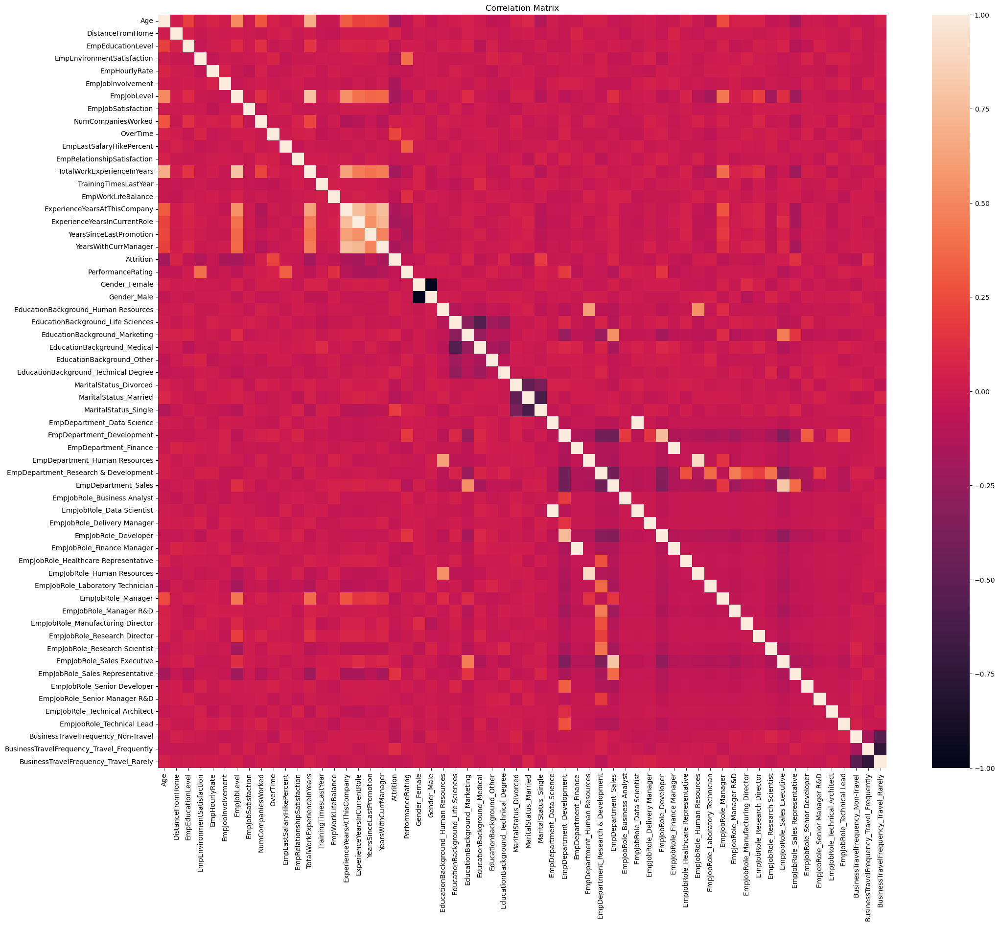

In [28]:
plt.figure(figsize=(24,20))
sns.heatmap(data.corr())
plt.title("Correlation Matrix")
plt.show()

In [30]:
correlations = data.corr()['PerformanceRating']
columns_to_drop = correlations[correlations < 0].index.tolist()
data = data.drop(columns=columns_to_drop)

In [36]:
data

,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpWorkLifeBalance,PerformanceRating,Gender_Female,EducationBackground_Human Resources,...,EmpJobRole_Delivery Manager,EmpJobRole_Developer,EmpJobRole_Manager,EmpJobRole_Manufacturing Director,EmpJobRole_Research Scientist,EmpJobRole_Senior Developer,EmpJobRole_Technical Architect,EmpJobRole_Technical Lead,BusinessTravelFrequency_Non-Travel,BusinessTravelFrequency_Travel_Frequently
0,3,4,4,1,0,12,2,3,0,0,...,0,0,0,0,0,0,0,0,0,0
1,4,4,1,2,0,12,3,3,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,4,1,5,1,21,3,4,0,0,...,0,0,0,0,0,0,0,0,0,1
3,4,2,4,3,0,15,2,3,0,1,...,0,0,1,0,0,0,0,0,0,0
4,4,1,1,8,0,14,3,3,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,1,4,4,1,1,20,3,4,1,0,...,0,0,0,0,0,0,0,0,0,1
1196,2,4,4,3,0,17,3,3,0,0,...,0,0,0,0,0,1,0,0,0,0
1197,1,4,3,1,1,11,3,3,0,0,...,0,0,0,0,0,1,0,0,0,0
1198,3,4,2,1,0,14,4,3,1,0,...,0,0,0,0,0,0,0,0,0,0


### split and train 

In [31]:
X = data.drop(columns=['PerformanceRating']) 
y = data['PerformanceRating']  

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [32]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

classifiers = {
    "Logistic Regression": LogisticRegression(random_state=42, max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "Support Vector Machine": SVC(random_state=42),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB()
}


for name, model in classifiers.items():
    print(f"\nTraining {name}...")
    # Train the model
    model.fit(X_train, y_train)
    # Make predictions
    y_pred = model.predict(X_test)
    # Evaluate the model
    print(f"\n{name} Results:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("\nClassification Report:\n", classification_report(y_test, y_pred))
    print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))



Training Logistic Regression...

Logistic Regression Results:
Accuracy: 0.8

Classification Report:
               precision    recall  f1-score   support

           2       0.36      0.34      0.35        29
           3       0.87      0.89      0.88       184
           4       0.75      0.67      0.71        27

    accuracy                           0.80       240
   macro avg       0.66      0.63      0.65       240
weighted avg       0.80      0.80      0.80       240


Confusion Matrix:
 [[ 10  15   4]
 [ 18 164   2]
 [  0   9  18]]

Training Decision Tree...

Decision Tree Results:
Accuracy: 0.7916666666666666

Classification Report:
               precision    recall  f1-score   support

           2       0.37      0.48      0.42        29
           3       0.90      0.85      0.87       184
           4       0.71      0.74      0.73        27

    accuracy                           0.79       240
   macro avg       0.66      0.69      0.67       240
weighted avg       0

### visualize 

Top 3 Important Factors Affecting Employee Performance:
                       Feature  Importance
1   EmpEnvironmentSatisfaction    0.363290
5     EmpLastSalaryHikePercent    0.327895
14   EmpDepartment_Development    0.081854


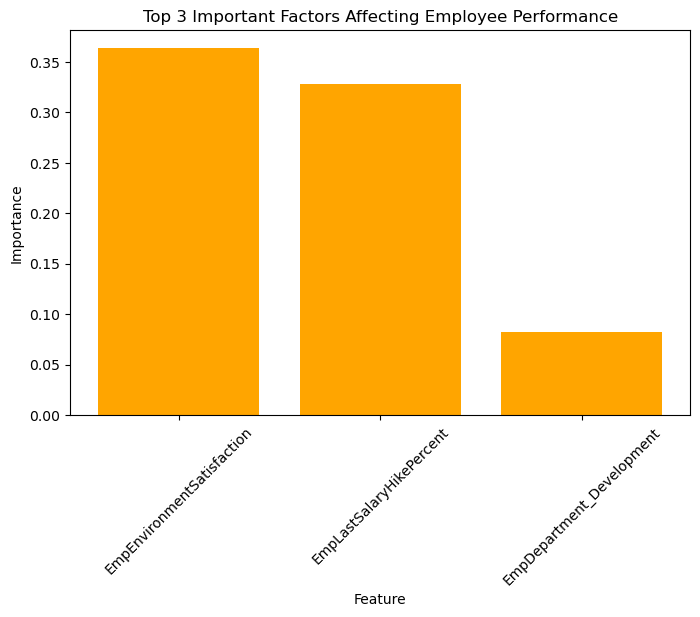

In [33]:
X = data.drop(columns=['PerformanceRating']) 
y = data['PerformanceRating'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)

feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': gb_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

top_3_features = feature_importances.head(3)
print("Top 3 Important Factors Affecting Employee Performance:")
print(top_3_features)
plt.figure(figsize=(8, 5))
plt.bar(top_3_features['Feature'], top_3_features['Importance'], color='orange')
plt.title('Top 3 Important Factors Affecting Employee Performance')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.xticks(rotation=45)
plt.show()

### A trained model which can predict the employee performance based on factors as inputs

In [35]:
new_candidate = {
    'EmpEducationLevel': 2,
    'EmpEnvironmentSatisfaction': 3,
    'EmpJobSatisfaction': 4,
    'NumCompaniesWorked': 2,
    'OverTime': 1,  
    'EmpLastSalaryHikePercent': 15,
    'EmpWorkLifeBalance': 3, 
    'Gender_Female': 0, 
    'EducationBackground_Human Resources': 0,
    'EducationBackground_Life Sciences': 1,
    'EducationBackground_Other': 0,
    'MaritalStatus_Divorced': 0,
    'MaritalStatus_Single': 1,
    'EmpDepartment_Data Science': 0,
    'EmpDepartment_Development': 1,
    'EmpJobRole_Business Analyst': 0,
    'EmpJobRole_Data Scientist': 0,
    'EmpJobRole_Delivery Manager': 0,
    'EmpJobRole_Developer': 1,
    'EmpJobRole_Manager': 0,
    'EmpJobRole_Manufacturing Director': 0,
    'EmpJobRole_Research Scientist': 0,
    'EmpJobRole_Senior Developer': 0,
    'EmpJobRole_Technical Architect': 0,
    'EmpJobRole_Technical Lead': 0,
    'BusinessTravelFrequency_Non-Travel': 0,
    'BusinessTravelFrequency_Travel_Frequently': 1
}

new_candidate_df = pd.DataFrame([new_candidate])
predicted_performance = gb_model.predict(new_candidate_df)
print("Predicted Performance Rating:", predicted_performance[0])


Predicted Performance Rating: 3
